# Concours MTH3302

## Calepin de base (succinct)

In [141]:
# using Pkg
# Pkg.add("Gadfly")
# import Pkg; Pkg.add("StatsBase")
# import Pkg; Pkg.add("MLJLinearModels")

In [142]:
using CSV, DataFrames, MLJLinearModels, MLJ
using Gadfly, MLBase, Random, Statistics, StatsBase, Combinatorics

In [143]:
train_data = CSV.read("train.csv", DataFrame, decimal=',')
test = CSV.read("test.csv", DataFrame, decimal=',');

Random.seed!(1234)


first(train_data, 5)

Row,annee,type,nombre_cylindres,cylindree,transmission,boite,consommation
,Int64,String31,Int64,Float64,String15,String15,Float64
1,2023,voiture_moyenne,8,4.4,integrale,automatique,13.8359
2,2020,VUS_petit,4,2.0,integrale,automatique,9.80042
3,2021,voiture_compacte,6,3.3,propulsion,automatique,11.7605
4,2023,voiture_deux_places,8,5.0,integrale,automatique,13.0672
5,2022,voiture_moyenne,8,4.4,integrale,automatique,13.8359


Data Exploration

In [144]:
describe(train_data)

Row,variable,mean,min,median,max,nmissing,eltype
,Symbol,Union…,Any,Union…,Any,Int64,DataType
1,annee,2019.19,2014,2019.0,2024,0,Int64
2,type,,VUS_petit,,voiture_sous_compacte,0,String31
3,nombre_cylindres,5.28535,3,4.0,12,0,Int64
4,cylindree,2.90303,1.2,2.5,6.8,0,Float64
5,transmission,,4x4,,traction,0,String15
6,boite,,automatique,,manuelle,0,String15
7,consommation,10.3568,4.52327,10.2265,16.8007,0,Float64


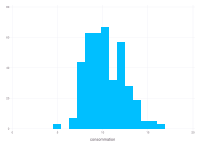

In [145]:
plot(train_data, x=:consommation, Geom.histogram(bincount=15))

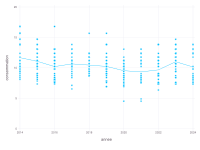

In [146]:
# Calculer la moyenne de la consommation
average_per_year = combine(groupby(train_data, :annee), :consommation => mean)

plot(
    layer(train_data, x=:annee, y=:consommation, Geom.point),
    layer(average_per_year, x=:annee, y=:consommation_mean, Geom.line),
    Guide.xlabel("annee"), Guide.ylabel("consommation")
)


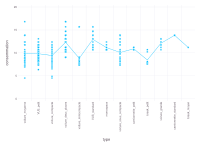

In [147]:
# analyser la consommation par type
average_per_type = combine(groupby(train_data, :type), :consommation => mean)
plot(
    layer(train_data, x=:type, y=:consommation, Geom.point),
    layer(average_per_type, x=:type, y=:consommation_mean, Geom.line),
    Guide.xlabel("type"), Guide.ylabel("consommation")
)

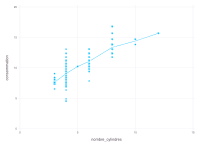

In [148]:
# analyser la consommation par nombre_cylindres
average_per_cylindres = combine(groupby(train_data, :nombre_cylindres), :consommation => mean)
plot(
    layer(train_data, x=:nombre_cylindres, y=:consommation, Geom.point),
    layer(average_per_cylindres, x=:nombre_cylindres, y=:consommation_mean, Geom.line),
    Guide.xlabel("nombre_cylindres"), Guide.ylabel("consommation")
)

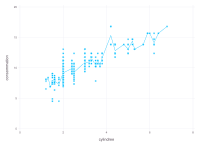

In [149]:
# analyser la consommation par cylindree
average_per_cylindree = combine(groupby(train_data, :cylindree), :consommation => mean)
plot(
    layer(train_data, x=:cylindree, y=:consommation, Geom.point),
    layer(average_per_cylindree, x=:cylindree, y=:consommation_mean, Geom.line),
    Guide.xlabel("cylindree"), Guide.ylabel("consommation")
)

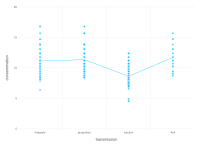

In [150]:
# Analyser la consommation par transmission
average_per_transmission = combine(groupby(train_data, :transmission), :consommation => mean)
plot(
    layer(train_data, x=:transmission, y=:consommation, Geom.point),
    layer(average_per_transmission, x=:transmission, y=:consommation_mean, Geom.line),
    Guide.xlabel("transmission"), Guide.ylabel("consommation")
)

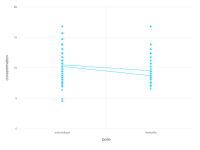

In [151]:
# Analyser la consommation par boite
average_per_boite = combine(groupby(train_data, :boite), :consommation => mean, :consommation => median)
plot(
    layer(train_data, x=:boite, y=:consommation, Geom.point),
    layer(average_per_boite, x=:boite, y=:consommation_median, Geom.line),
    layer(average_per_boite, x=:boite, y=:consommation_mean, Geom.line),
    Guide.xlabel("boite"), Guide.ylabel("consommation")
)

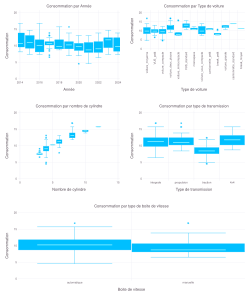

In [152]:
function box_plot_categorical(data)
    Gadfly.set_default_plot_size(25cm, 30cm)
    p1 = plot(data, x=:annee, y=:consommation, Geom.boxplot, Guide.title("Consommation par Année"), Guide.xlabel("Année"), Guide.ylabel("Consommation"))
    p2 = plot(data, x=:type, y=:consommation, Geom.boxplot, Guide.title("Consommation par Type de voiture"), Guide.xlabel("Type de voiture"), Guide.ylabel("Consommation"))
    p3 = plot(data, x=:nombre_cylindres, y=:consommation, Geom.boxplot, Guide.title("Consommation par nombre de cylindre"), Guide.xlabel("Nombre de cylindre"), Guide.ylabel("Consommation"))
    p4 = plot(data, x=:transmission, y=:consommation, Geom.boxplot, Guide.title("Consommation par type de transmission"), Guide.xlabel("Type de transmission"), Guide.ylabel("Consommation"))
    p5 = plot(data, x=:boite, y=:consommation, Geom.boxplot, Guide.title("Consommation par type de boite de vitesse"), Guide.xlabel("Boite de vitesse"), Guide.ylabel("Consommation"))

    grid = vstack(hstack(p1, p2), hstack(p3, p4), p5)
    display(grid)

    # reset default plot size
    Gadfly.set_default_plot_size(20cm, 15cm)
end

box_plot_categorical(train_data)


### Gestion des données aberrantes

In [ ]:
# interquartile range IQR
function remove_outliers(data, column)
    unique_values = unique(data[:, column])
    for value in unique_values
        subset = data[data[:, column] .== value, :]
        if size(subset, 1) == 0
            continue
        end
        q1 = quantile(subset[:, :consommation], 0.25)
        q3 = quantile(subset[:, :consommation], 0.75)
        iqr = q3 - q1
        lower_bound = q1 - 1.5 * iqr
        upper_bound = q3 + 1.5 * iqr
        data = data[(data[:, column] .!= value) .| ((data[:, column] .== value) .& (data[:, :consommation] .>= lower_bound) .& (data[:, :consommation] .<= upper_bound)), :]
    end
    return data
end

# copy the
filtered_train = copy(train_data)

println("Before removing outliers: ", size(train_data, 1))

filtered_train = remove_outliers(filtered_train, :annee);
filtered_train = remove_outliers(filtered_train, :type);
filtered_train = remove_outliers(filtered_train, :nombre_cylindres);
filtered_train = remove_outliers(filtered_train, :transmission);
filtered_train = remove_outliers(filtered_train, :boite);

println("After removing outliers: ", size(filtered_train, 1))

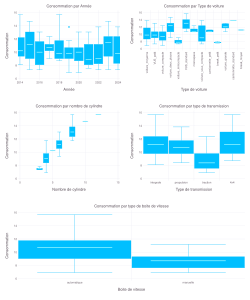

In [154]:
box_plot_categorical(filtered_train)

# Régression linéaire avec une seule variable explicative : nombre de cylindres

In [155]:
# x = train.nombre_cylindres
# y = train.consommation

# n = length(y)

## Ajustement sur l'ensemble d'entraînement

In [156]:
# using Statistics

# ȳ = mean(y)
# X = hcat(ones(n), x)

# β̂ = X\y;

## Prédiction sur l'ensemble de test

In [157]:
# x = test.nombre_cylindres
# n = length(x)

# X = hcat(ones(n), x)
# ŷ = X*β̂;

## Regression Ridge
### ref TD9

In [158]:
# standardisation de consommation et cylindree
dt_1 = StatsBase.fit(StatsBase.ZScoreTransform, filtered_train.consommation)
filtered_train.consommation = StatsBase.transform(dt_1, filtered_train.consommation)

dt_2 = StatsBase.fit(StatsBase.ZScoreTransform, filtered_train.cylindree)
filtered_train.cylindree = StatsBase.transform(dt_2, filtered_train.cylindree);

In [159]:
# One-hot encoding https://stackoverflow.com/questions/64681247/why-isnt-the-mlj-onehotencoder-transforming-the-data-frame

function one_hot_encode(data, columns)
    for column in columns
        if column in ["consommation", "cylindree"]
            continue
        end
        coerce!(data, column => Multiclass)
    end

    one_hot = machine(OneHotEncoder(), data)
    fit!(one_hot, verbosity=0)
    data = MLJ.transform(one_hot, data)
    return data
end

# filtered_train = one_hot_encode(filtered_train, names(filtered_train));

one_hot_encode (generic function with 1 method)

### split train test

In [160]:
# Partager les données en données d'entraînement (80%) et de validation (20%)
train_id = sample(1:nrow(filtered_train), round(Int, .8*nrow(filtered_train)), ordered=true, replace=false)
valid_id = setdiff(1:nrow(filtered_train), train_id)

println("Taille de l'ensemble d'entraînement: ", length(train_id))
println("Taille de l'ensemble de validation: ", length(valid_id))

Taille de l'ensemble d'entraînement: 289
Taille de l'ensemble de validation: 72


In [161]:
# https://juliaai.github.io/DataScienceTutorials.jl/getting-started/fit-and-predict/
# https://juliaai.github.io/MLJ.jl/dev/

function ridge_reg(X, y, λ=6.0)
    ridge_model = @load RidgeRegressor pkg=MLJLinearModels verbosity=0
    ridge_m = ridge_model(lambda=λ) 
    ridge_machine = machine(ridge_m, X, y)
    fit!(ridge_machine, verbosity=0)

    return ridge_machine
end


ridge_reg (generic function with 2 methods)

In [162]:
first(filtered_train, 5)
names(filtered_train)

7-element Vector{String}:
 "annee"
 "type"
 "nombre_cylindres"
 "cylindree"
 "transmission"
 "boite"
 "consommation"

In [164]:
# names = ["annee", "type", "nombre_cylindres", "cylindree", "transmission", "boite", "consommation"]
features_names = ["annee", "type", "nombre_cylindres", "cylindree", "transmission", "boite", "consommation"]

filtered_train = one_hot_encode(filtered_train, features_names);
# filtered_train = one_hot_encode(filtered_train, names(filtered_train));

train = filtered_train[train_id,:]
valid = filtered_train[valid_id,:]

nb_columns_without_last = size(train, 2) - 1
X_train = train[:, 1:nb_columns_without_last]
y_train = train.consommation

X_valid = valid[:, 1:nb_columns_without_last]

# get real L/100km values for RMSE
y_valid = train_data[valid_id, :consommation]

first(X_train, 5)

Row,annee__2014,annee__2015,annee__2016,annee__2017,annee__2018,annee__2019,annee__2020,annee__2021,annee__2022,annee__2023,annee__2024,type__VUS_petit,type__VUS_standard,type__break_moyen,type__break_petit,type__camionnette_petit,type__camionnette_standard,type__monospace,type__voiture_compacte,type__voiture_deux_places,type__voiture_grande,type__voiture_minicompacte,type__voiture_moyenne,type__voiture_sous_compacte,nombre_cylindres__3,nombre_cylindres__4,nombre_cylindres__5,nombre_cylindres__6,nombre_cylindres__8,nombre_cylindres__10,nombre_cylindres__12,cylindree,transmission__4x4,transmission__integrale,transmission__propulsion,transmission__traction,boite__automatique,boite__manuelle
,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.34133,0.0,1.0,0.0,0.0,1.0,0.0
2,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,-0.770094,0.0,1.0,0.0,0.0,1.0,0.0
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.86918,0.0,1.0,0.0,0.0,1.0,0.0
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.34133,0.0,1.0,0.0,0.0,1.0,0.0
5,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.34133,0.0,1.0,0.0,0.0,1.0,0.0


In [ ]:
# # Function to evaluate different models
# function evaluate_model(model, X_train, y_train, X_valid, y_valid)
#     println("Evaluating model: ", model)
#     machine_ = machine(model, X_train, y_train)
#     fit!(machine_, verbosity=0)
    
#     ŷ_valid = predict_mode(machine_, X_valid)
#     ŷ_valid = ŷ_valid .* std(train_data.consommation) .+ mean(train_data.consommation)
    
#     rmse_value = rmse(y_valid, ŷ_valid)

#     println("RMSE for model ", model, ": ", rmse_value)
#     return rmse_value
# end

# # Try different combinations of features
# variables = names(filtered_train)
# deleteat!(variables, findfirst(x -> x == "consommation", variables))

# best_rmse = Inf
# best_combination = []
# best_lambda = 0.0

# println("Starting feature selection Ridge...")
# for variable_combination in combinations(variables)
#     println("Evaluating combination: ", variable_combination)
#     data = copy(filtered_train)

#     push!(variable_combination, "consommation")
#     data = data[:, variable_combination]
#     data = one_hot_encode(data, variable_combination)
#     train = data[train_id,:]
#     valid = data[valid_id,:]
    
#     nb_columns_without_last = size(train, 2) - 1
#     X_train = train[:, 1:nb_columns_without_last]
#     y_train = train.consommation
    
#     X_valid = valid[:, 1:nb_columns_without_last]
    
#     # get real L/100km values for RMSE
#     y_valid = train_data[valid_id, :consommation]

#     for λ in 0.0:0.15:8.0
#         rmse_value = evaluate_model(RidgeRegressor(lambda=λ), X_train, y_train, X_valid, y_valid)
#         if rmse_value < best_rmse
#             best_rmse = rmse_value
#             best_combination = variable_combination
#             best_lambda = λ
#             println("New best RMSE: ", best_rmse, " with combination: ", best_combination)
#         end
#     end
# end

# println("Best RMSE: ", best_rmse)
# println("Best Combination: ", best_combination)



In [ ]:
# # Try different models
# models = [
#     @load LinearRegressor pkg=MLJLinearModels,
#     @load LassoRegressor pkg=MLJGLM,
#     @load ElasticNetRegressor pkg=MLJGLM,
#     @load DecisionTreeRegressor pkg=MLJDecisionTreeInterface,
#     @load RandomForestRegressor pkg=MLJEnsembles,
#     @load GradientBoostingRegressor pkg=MLJEnsembles
# ]

# println("Starting model evaluation...")
# for model in models
#     data = copy(filtered_train)
    
#     data = one_hot_encode(data, variable_combination)
#     train = data[train_id,:]
#     valid = data[valid_id,:]
    
#     nb_columns_without_last = size(train, 2) - 1
#     X_train = train[:, 1:nb_columns_without_last]
#     y_train = train.consommation
    
#     X_valid = valid[:, 1:nb_columns_without_last]
    
#     # get real L/100km values for RMSE
#     y_valid = train_data[valid_id, :consommation]
#     rmse_value = evaluate_model(model(), X_train, y_train, X_valid, y_valid)
#     println("RMSE for ", model, ": ", rmse_value)
# end


### Optimisation Lambda

In [ ]:

for λ in 0.0:0.1:10.0
    ridge_machine = ridge_reg(X_train, y_train, λ)
    ŷ_valid = predict_mode(ridge_machine, X_valid)
    ŷ_valid = ŷ_valid .* std(train_data.consommation) .+ mean(train_data.consommation)

    println("Ridge RMSE for λ = ", λ, ": ", rmse(y_valid, ŷ_valid))
end


Ridge RMSE for λ = 0.0: 3.1467014842813246
Ridge RMSE for λ = 0.1: 3.0142076528095214
Ridge RMSE for λ = 0.2: 2.9258157309519786
Ridge RMSE for λ = 0.3: 2.856582796210101
Ridge RMSE for λ = 0.4: 2.799256283917887
Ridge RMSE for λ = 0.5: 2.7505277683820277
Ridge RMSE for λ = 0.6: 2.7084424163199388
Ridge RMSE for λ = 0.7: 2.6716841874397006
Ridge RMSE for λ = 0.8: 2.6392990169431654
Ridge RMSE for λ = 0.9: 2.6105629360720997
Ridge RMSE for λ = 1.0: 2.584909652234415
Ridge RMSE for λ = 1.1: 2.561886558780387
Ridge RMSE for λ = 1.2: 2.5411260011948933
Ridge RMSE for λ = 1.3: 2.5223254885198583
Ridge RMSE for λ = 1.4: 2.5052335198017315
Ridge RMSE for λ = 1.5: 2.489639125761726
Ridge RMSE for λ = 1.6: 2.47536397133644
Ridge RMSE for λ = 1.7: 2.4622562810344215
Ridge RMSE for λ = 1.8: 2.4501860953993844
Ridge RMSE for λ = 1.9: 2.43904151987607
Ridge RMSE for λ = 2.0: 2.428725726322085
Ridge RMSE for λ = 2.1: 2.419154533589429
Ridge RMSE for λ = 2.2: 2.410254439128609
Ridge RMSE for λ = 2.3:

### Prédictions

In [ ]:
ridge_machine = ridge_reg(X_train, y_train)

ŷ_valid = predict_mode(ridge_machine, X_valid)

ŷ_valid = ŷ_valid .* std(train_data.consommation) .+ mean(train_data.consommation)

first(ŷ_valid, 5)

println("Ridge RMSE: ", rmse(y_valid, ŷ_valid))

Ridge RMSE: 2.2746671014700586


# Création du fichier de prédictions

In [ ]:
## transform test data
coerce!(test, :type => Multiclass, :transmission => Multiclass, :boite => Multiclass, :nombre_cylindres => Multiclass, :annee => Multiclass)

one_hot = machine(OneHotEncoder(), test)
fit!(one_hot)

test = MLJ.transform(one_hot, test)

dt = StatsBase.fit(StatsBase.ZScoreTransform, test.cylindree)
test.cylindree = StatsBase.transform(dt, test.cylindree);

[ Info: Training machine(OneHotEncoder(features = Symbol[], …), …).
[ Info: Spawning 11 sub-features to one-hot encode feature :annee.
[ Info: Spawning 13 sub-features to one-hot encode feature :type.
[ Info: Spawning 6 sub-features to one-hot encode feature :nombre_cylindres.
[ Info: Spawning 4 sub-features to one-hot encode feature :transmission.
[ Info: Spawning 2 sub-features to one-hot encode feature :boite.


In [ ]:
size_features = size(test, 2) - 1

X_train = filtered_train[:, 1:size_features]
y_train = filtered_train.consommation

X_pred = test[:, 1:size_features]

ridge_machine = ridge_reg(X_train, y_train)

trained Machine; caches model-specific representations of data
  model: RidgeRegressor(lambda = 6.0, …)
  args: 
    1:	Source @103 ⏎ Table{AbstractVector{Continuous}}
    2:	Source @304 ⏎ AbstractVector{Continuous}


In [ ]:
ŷ = predict_mode(ridge_machine, test)

150-element Vector{Float64}:
 -0.01707880386226554
 -0.06770459370556212
 -0.07205024615279877
  0.04028560190514816
  0.055817464090126424
  0.004536088787636408
  0.05516187863093299
  0.040613394634744886
 -0.03344565225031649
  0.0707000977318464
  0.0707000977318464
 -0.008030597266840961
 -0.07245998706479467
  ⋮
 -0.07188203564301303
 -0.009058867172684573
  0.014794624759255269
 -0.07904541811883621
 -0.07848012485732703
 -0.07937321084843293
 -0.05744293446882442
 -0.07674221931263966
  0.03235274253846363
 -0.01827304730483295
 -0.0008358259016456194
 -0.0761769260511305

In [ ]:
# convert to L/100km (invert standardize)
ŷ = ŷ .* std(train_data.consommation) .+ mean(train_data.consommation)

150-element Vector{Float64}:
 10.320256308812162
 10.211929112363439
 10.202630445660029
 10.443002546885003
 10.47623705228896
 10.366507058273092
 10.474834254721815
 10.443703945668576
 10.285235130751202
 10.508082362419849
 10.508082362419849
 10.339617327305012
 10.201753697180564
  ⋮
 10.202990376300018
 10.33741707331515
 10.38845789489043
 10.187662434887198
 10.18887202854253
 10.186961036103625
 10.233886632028193
 10.192590734678896
 10.426028107223422
 10.317700910774699
 10.35501243350471
 10.19380032833423

In [ ]:
# n = length(y)
id = 1:n

df_pred = DataFrame(id=id, consommation=ŷ)

CSV.write("benchmark.csv", df_pred)

LoadError: UndefVarError: `n` not defined